## Camera calibration

In [1]:
%matplotlib inline

import numpy as np
import cv2
import matplotlib.pyplot as plt

# Read in images
img1   = cv2.imread('bulb1.jpg') # third dimension: colour (BGR)
img2   = cv2.imread('bulb2.jpg')
img1   = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2   = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

calib = []
n_calib = 24
for i in range(n_calib):
    c = cv2.imread('check' + str(i) + '.jpg')
    c = cv2.cvtColor(c, cv2.COLOR_BGR2RGB)
    calib.append(c)

In [2]:
calib[0].shape

(3000, 4000, 3)

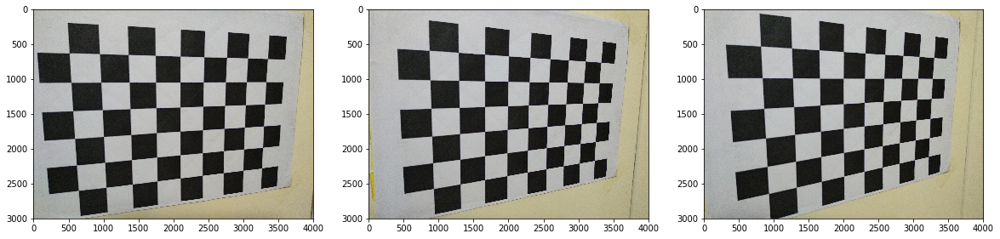

In [3]:
# Display checkerboards

plt.figure(1, figsize=(20,10))
plt.subplot(1, 3, 1)
plt.imshow(calib[1], cmap = None, interpolation = None) 
#plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis

plt.subplot(1, 3, 2), plt.imshow(calib[2], cmap = None, interpolation = None)
plt.subplot(1, 3, 3), plt.imshow(calib[3], cmap = None, interpolation = None)

plt.show()

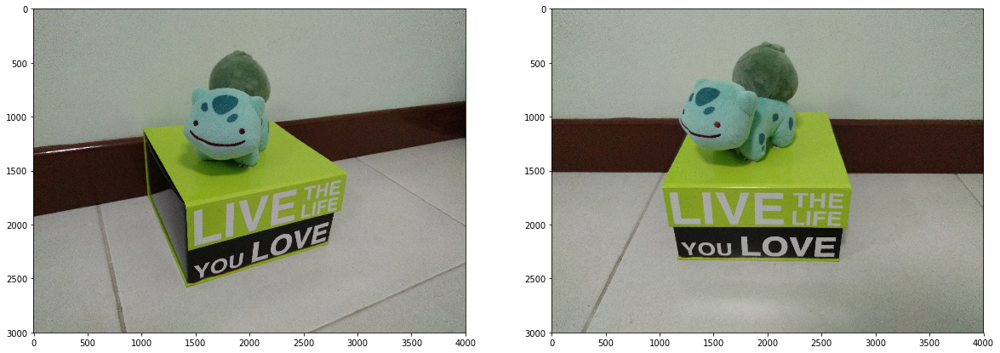

In [4]:
# Display two photos

plt.figure(1, figsize=(20,10))
plt.subplot(1, 2, 1)
plt.imshow(img1, cmap = None, interpolation = None) 
#plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis

plt.subplot(1, 2, 2)
plt.imshow(img2, cmap = None, interpolation = None)

plt.show()

In [5]:
# Checkerboard is 9x6
dims = (9,6)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(7,5,0)
objp = np.zeros((dims[0]*dims[1],3), np.float32)
objp[:,:2] = np.mgrid[0:dims[0],0:dims[1]].T.reshape(-1,2)

objpoints = []
imgpoints = [] 

calib_cnr = []
for i in range(n_calib):
    calib_cnr.append(calib[i].copy())

In [6]:
# Image dimensions
calib_cnr[0].shape

(3000, 4000, 3)

0
1
2
4
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22


C:\Users\arborea\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


23


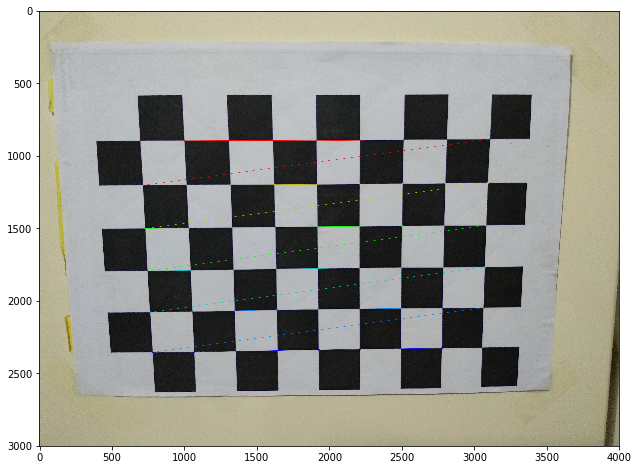

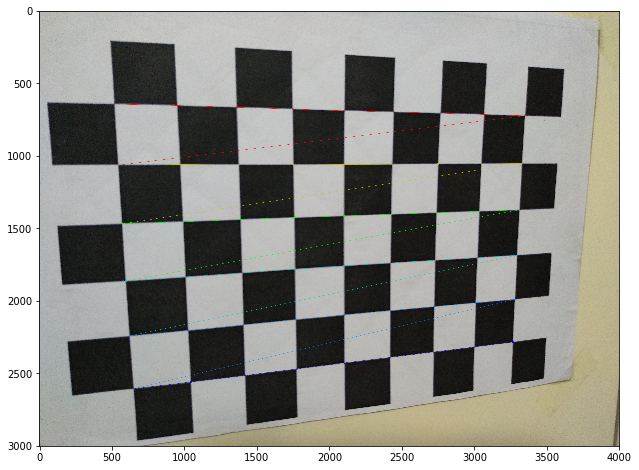

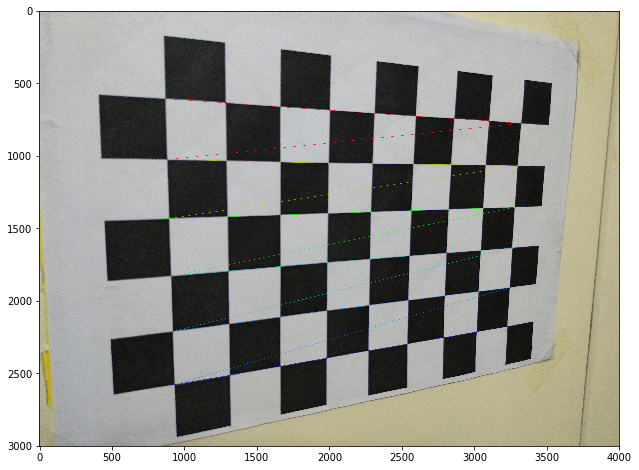

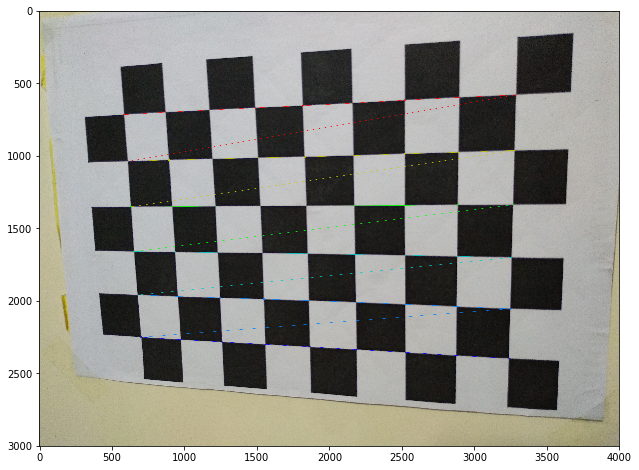

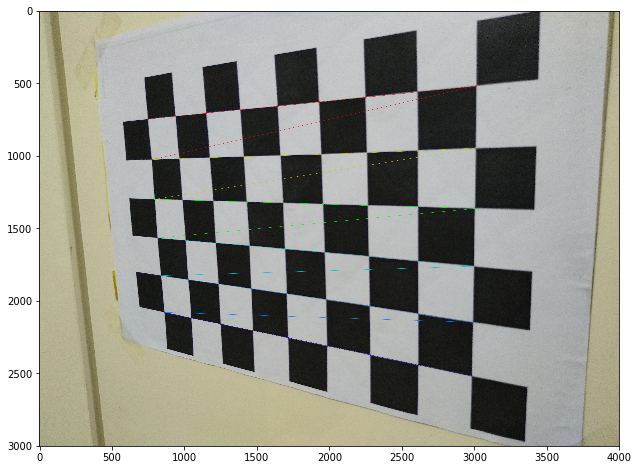

...

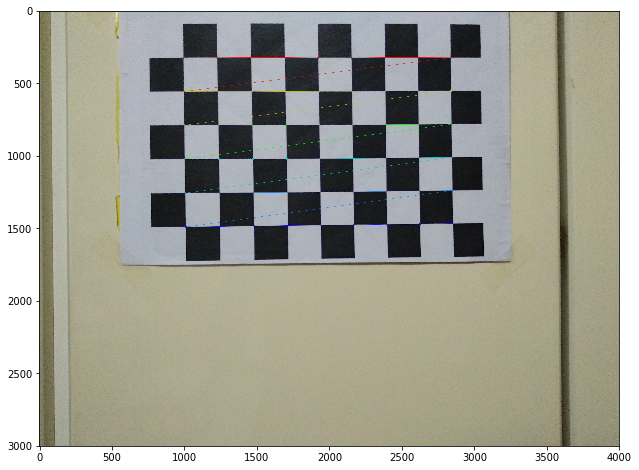

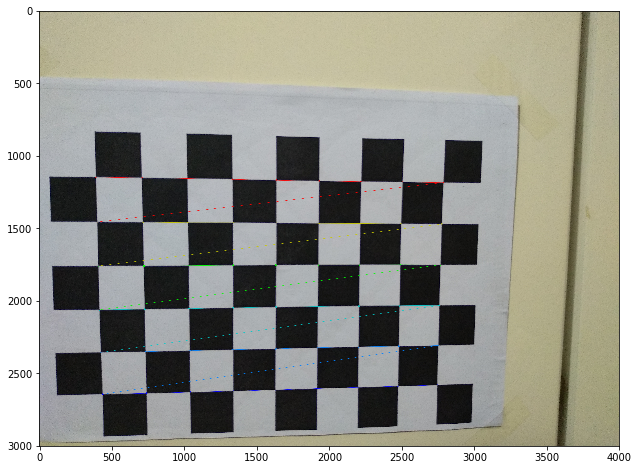

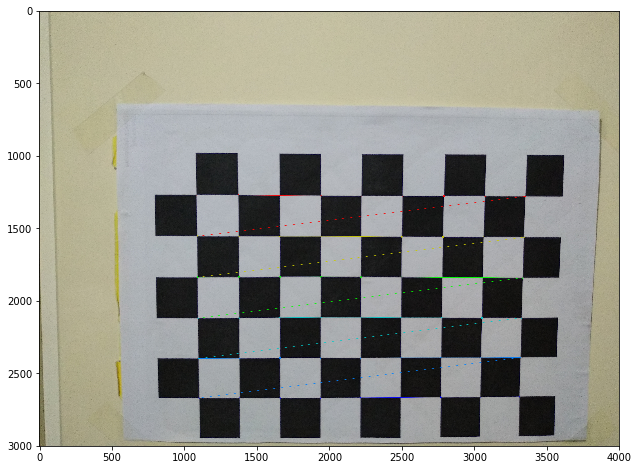

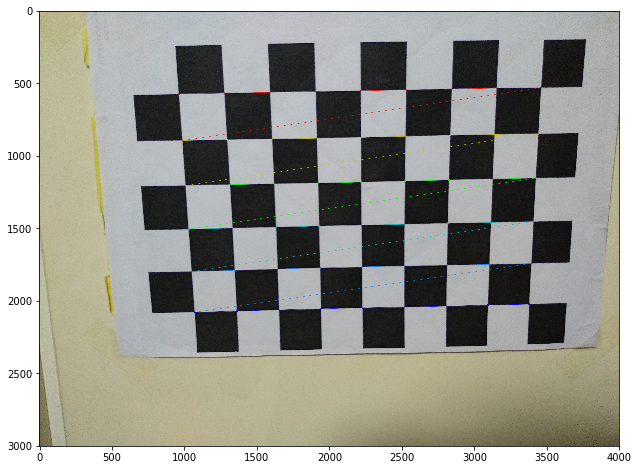

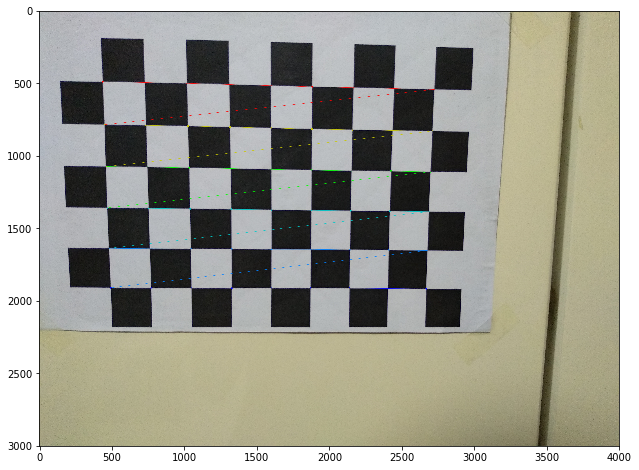

In [7]:
counter = 0

for c in calib_cnr:
    gray = cv2.cvtColor(c,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, dims, None)
    if ret == True:
        print(counter)
        objpoints.append(objp)

        # increase corner accuracy
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        calib_disp = cv2.drawChessboardCorners(c, dims, corners2,ret)

        # Display with plt.imshow (lines in RGB instead of BGR)
        plt.figure(figsize=(16,8))
        plt.imshow(calib_disp, cmap = None, interpolation = None)
        
        # # Display with cv2.imshow
        # winname = "win"
        # cv2.namedWindow(winname)
        # cv2.moveWindow(winname, 40,30)
        # cv2.imshow(winname, cv2.resize(calib_disp, (800, 600)))
        # cv2.waitKey(0)  

    counter += 1
    
# cv2.destroyAllWindows()

In [8]:
# Check how many checkerboards were detected
len(objpoints)

22

In [9]:
# get intrinsic matrix and distortion
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

In [11]:
np.set_printoptions(suppress=True)
mtx

array([[3142.48386708,    0.        , 2008.49963471],
       [   0.        , 3156.22945417, 1484.50729327],
       [   0.        ,    0.        ,    1.        ]])

In [12]:
dist

array([[ 0.20383419, -0.97347178,  0.00126873, -0.0003432 ,  1.34568011]])

In [13]:
# Reprojection error
tot_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    tot_error += error

print("mean error: " + str (tot_error/len(objpoints)))

mean error: 0.21020819135577903


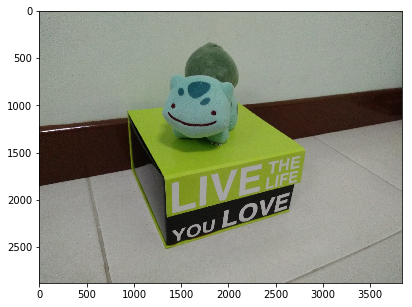

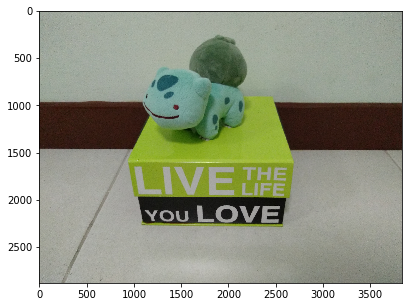

In [23]:
# Undistort and save images

from matplotlib.image import imsave

h, w = img1.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

img1_undst = img1.copy()
img2_undst = img2.copy()
count = 1
for img in (img1_undst, img2_undst):
    # undistort
    dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

    # crop the image
    x,y,w,h = roi
    dst = dst[y:y+h, x:x+w]

    # Display with plt.imshow (lines in RGB instead of BGR)
    plt.figure(figsize=(10,5))
    plt.imshow(dst, cmap = None, interpolation = None)
    imsave("bulbc" + str(count) + ".png", dst)
    count += 1

In [24]:
roi

(80, 59, 3842, 2878)

## Hand-pick points on undistorted images and estimate E, draw epipolar lines

In [122]:
# Work with undistorted images

img1   = cv2.imread('bulbc1.png') # third dimension: colour (BGR)
img2   = cv2.imread('bulbc2.png')
img1   = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2   = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

In [156]:
# Hand-pick correspondences for ground truth
c1 = np.array([[1402., 1822.],
               [2360., 1618.],
               [1407., 2325.],
               [2337., 2011.],
               [1368., 1072.],
               [1880., 1166.],
               [1902., 1401.],
               [2820., 1473.],
               [1851., 1052.]
              ])

c2 = np.array([[1009., 1647.],
               [2062., 1654.],
               [1118., 2106.],
               [2121., 2062.],
               [1110., 957.],
               [1480., 1108.],
               [1769., 1349.],
               [2696., 1605.],
               [1453., 993.]
              ])

In [157]:
mtx

array([[3142.48386708,    0.        , 2008.49963471],
       [   0.        , 3156.22945417, 1484.50729327],
       [   0.        ,    0.        ,    1.        ]])

In [158]:
from numpy.linalg import inv
mtx_i = inv(mtx)
mtx_i

array([[ 0.00031822,  0.        , -0.63914398],
       [ 0.        ,  0.00031683, -0.47034201],
       [ 0.        ,  0.        ,  1.        ]])

In [159]:
c1_f = np.concatenate((c1, np.ones((c1.shape[0], 1))), axis=1)
c2_f = np.concatenate((c2, np.ones((c1.shape[0], 1))), axis=1)

In [160]:
# Normalise image points by multiplying intrinsic matrix inverse
c1_norm = np.dot(mtx_i, c1_f.T)
c2_norm = np.dot(mtx_i, c2_f.T)
c1_pt = c1_norm[:2].T
c2_pt = c2_norm[:2].T

In [192]:
c1_pt

array([[-0.19300008,  0.10692908],
       [ 0.11185431,  0.04229499],
       [-0.19140898,  0.26629645],
       [ 0.10453526,  0.16681066],
       [-0.20381955, -0.13069623],
       [-0.0408911 , -0.10091386],
       [-0.03389027, -0.02645793],
       [ 0.25823533, -0.0036459 ],
       [-0.05011947, -0.13703291]])

In [161]:
c1_norm.shape

(3, 9)

In [162]:
# Estimate E with normalised points
F, inliers = cv2.findEssentialMat(c2_pt,c1_pt)
print("Inliers:" + str(sum(inliers)[0]) + '/' + str(inliers.shape[0]))
print("F shape: " + str(F.shape))

Inliers:9/9
F shape: (3, 3)


In [163]:
F

array([[-0.01293429, -0.1909383 , -0.10833719],
       [-0.13092871,  0.0307668 , -0.68630072],
       [-0.02572282,  0.679591  ,  0.00592726]])

In [164]:
c1_norm.T

array([[-0.19300008,  0.10692908,  1.        ],
       [ 0.11185431,  0.04229499,  1.        ],
       [-0.19140898,  0.26629645,  1.        ],
       [ 0.10453526,  0.16681066,  1.        ],
       [-0.20381955, -0.13069623,  1.        ],
       [-0.0408911 , -0.10091386,  1.        ],
       [-0.03389027, -0.02645793,  1.        ],
       [ 0.25823533, -0.0036459 ,  1.        ],
       [-0.05011947, -0.13703291,  1.        ]])

In [165]:
# Check that X'.T F X = 0 for every correspondence
for i in range(c1_norm.shape[1]):
    print(c1_norm[:,i].T @ F @ c2_norm[:,i])

0.0023452347272111124
-0.00035694178319448794
0.003000243228221483
-4.163336342344337e-17
2.7755575615628914e-17
1.3877787807814457e-17
0.0
-0.0017433409541025915
1.3877787807814457e-17


In [166]:
def drawlines(img1,img2,lines,pts1,pts2,K1):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    rw,c,ch = img1.shape
    
    img1 = img1.copy()
    img2 = img2.copy()
    
    fx = K1[0,0]
    fy = K1[1,1]
    px = K1[0,2]
    py = K1[1,2]
    
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())

        x0,y0 = map(int, [-fx + px, fy*(-(r[0]*-1 + r[2])/r[1]) + py ])
        x1,y1 = map(int, [ fx + px, fy*(-(r[0]* 1 + r[2])/r[1]) + py ])
        
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color, 4)
        img1 = cv2.circle(img1,(pt1[0],pt1[1]),20,color,-1)
        img2 = cv2.circle(img2,(pt2[0],pt2[1]),20,color,-1)
        
    return img1,img2

In [167]:
# Drawing epipolar lines

lines1 = cv2.computeCorrespondEpilines(c2_pt.reshape(-1,1,2), 1, F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(img1,img2,lines1,c1.astype(int),c2.astype(int), mtx)

lines2 = cv2.computeCorrespondEpilines(c1_pt.reshape(-1,1,2), 2, F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(img2,img1,lines2,c2.astype(int),c1.astype(int), mtx)

Estimated ground truth from hand-picked coordinates


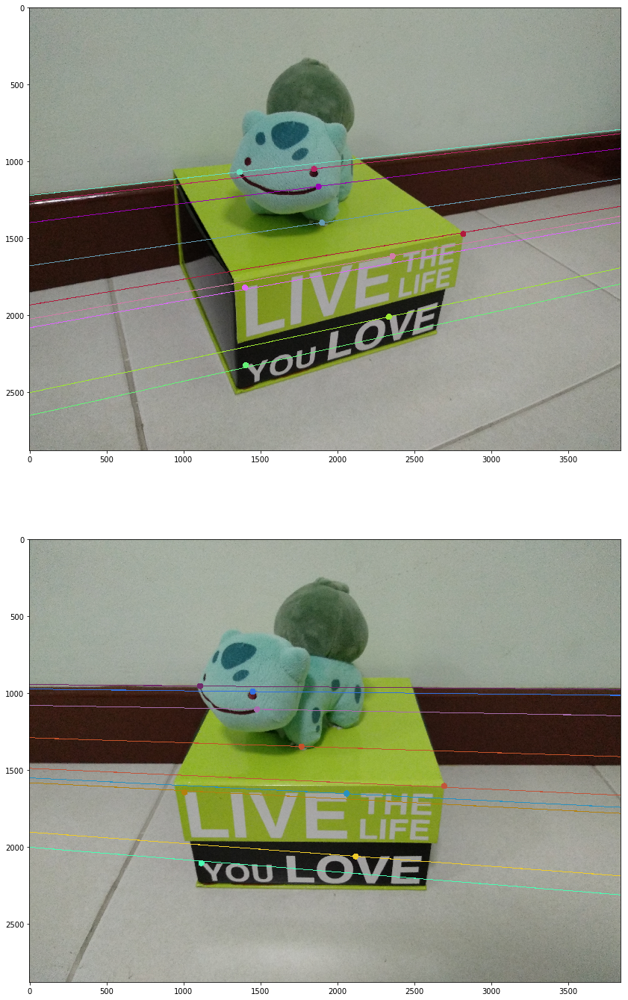

In [168]:
print("Estimated ground truth from hand-picked coordinates")
plt.figure(2, figsize=(16,24))
plt.subplot(211),plt.imshow(img5)
plt.subplot(212),plt.imshow(img3)
plt.show()

## Check returned matrix

In [172]:
from numpy.linalg import matrix_rank, svd
matrix_rank(F, tol = 1e-9) # tolerance must be a certain size for the rank to be 2

2

In [188]:
# Check that S from SVD(F) has a zero singular value
u, s, vh = np.linalg.svd(F, full_matrices=True)
print(u.shape, s.shape, vh.shape)
print()
np.set_printoptions(suppress=False)
print(s)

(3, 3) (3,) (3, 3)

[7.07106782e-01 7.07106781e-01 8.33544197e-10]


In [187]:
# Compare F and USV.T
print(F)
print()
print(u @ np.diag(s) @ vh)

[[-0.01293429 -0.1909383  -0.10833719]
 [-0.13092871  0.0307668  -0.68630072]
 [-0.02572282  0.679591    0.00592726]]

[[-0.01293429 -0.1909383  -0.10833719]
 [-0.13092871  0.0307668  -0.68630072]
 [-0.02572282  0.679591    0.00592726]]


In [190]:
from scipy.linalg import null_space
np.set_printoptions(suppress=False)
e1 = null_space(F.T, 1e-8)
e2 = null_space(F  , 1e-8)

print(e1)
print(e2)
print()
if (e1.size > 0):
    print("Epipole in image 1: " + str((e1 / e1[2])[:2,0]))
if (e2.size > 0):
    print("Epipole in image 2: " + str((e2 / e2[2])[:2,0]))
print()
# Epipoles are normalised to (u, v, 1)

print("Check that epipoles are correct nullspaces (multiply by F)")
print(e1.T @ F)
print(F @ e2)
print()

[[ 0.95040867]
 [-0.14766448]
 [ 0.27371255]]
[[-0.98186426]
 [-0.03878255]
 [ 0.1855761 ]]

Epipole in image 1: [ 3.47228757 -0.53948742]
Epipole in image 2: [-5.29089824 -0.20898463]

Check that epipoles are correct nullspaces (multiply by F)
[[ 8.18427314e-10  3.23270022e-11 -1.54685914e-10]]
[[-7.92207709e-10]
 [ 1.23084792e-10]
 [-2.28151507e-10]]



In [191]:
# Extract normalised points to test estimation method
print(c1_pt)
print(c2_pt)

[[-0.19300008  0.10692908]
 [ 0.11185431  0.04229499]
 [-0.19140898  0.26629645]
 [ 0.10453526  0.16681066]
 [-0.20381955 -0.13069623]
 [-0.0408911  -0.10091386]
 [-0.03389027 -0.02645793]
 [ 0.25823533 -0.0036459 ]
 [-0.05011947 -0.13703291]]
[[-0.31806039  0.05148317]
 [ 0.01702487  0.05370101]
 [-0.28337445  0.19690986]
 [ 0.03579982  0.18296918]
 [-0.28592021 -0.16713211]
 [-0.16817895 -0.11929022]
 [-0.07621348 -0.04293328]
 [ 0.2187761   0.03817616]
 [-0.17677088 -0.1557261 ]]


## Recover R and t

In [ ]:
import cv2
import numpy as np

F = np.array([[-0.01293429, -0.1909383,  -0.10833719],
             [-0.13092871 , 0.0307668 , -0.68630072],
             [-0.02572282 , 0.679591  ,  0.00592726]])

c1_pt = np.array([[-0.19300008,   0.10692908],
                 [ 0.11185431 ,  0.04229499],
                 [-0.19140898 ,  0.26629645],
                 [ 0.10453526 ,  0.16681066],
                 [-0.20381955 , -0.13069623],
                 [-0.0408911  , -0.10091386],
                 [-0.03389027 , -0.02645793],
                 [ 0.25823533 , -0.0036459 ],
                 [-0.05011947 , -0.13703291]])

c2_pt = np.array([[-0.31806039,   0.05148317],
                 [ 0.01702487 ,  0.05370101],
                 [-0.28337445 ,  0.19690986],
                 [ 0.03579982 ,  0.18296918],
                 [-0.28592021 , -0.16713211],
                 [-0.16817895 , -0.11929022],
                 [-0.07621348 , -0.04293328],
                 [ 0.2187761  ,  0.03817616],
                 [-0.17677088 , -0.1557261 ] ])

In [7]:
points, R, t, mask = cv2.recoverPose(F, c2_pt, c1_pt)

In [8]:
R

array([[ 0.8771197 ,  0.19068712, -0.44079411],
       [-0.17455332,  0.98160835,  0.07730574],
       [ 0.44742839,  0.00913568,  0.8942731 ]])

In [15]:
t

array([[ 0.95040867],
       [-0.14766448],
       [ 0.27371254]])

In [12]:
mask

array([[255],
       [255],
       [255],
       [255],
       [255],
       [255],
       [255],
       [255],
       [255]], dtype=uint8)

## Undistort any image by the same camera (at the same focal length)

In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt

mtx = np.array([[3142.48386708,    0.        , 2008.49963471],
                [   0.        , 3156.22945417, 1484.50729327],
                [   0.        ,    0.        ,    1.        ]])

dist = np.array([[ 0.20383419, -0.97347178,  0.00126873, -0.0003432 ,  1.34568011]])

# Read in images
img1   = cv2.imread('lights1.jpg') # third dimension: colour (BGR)
img2   = cv2.imread('lights2.jpg')
img1   = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2   = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

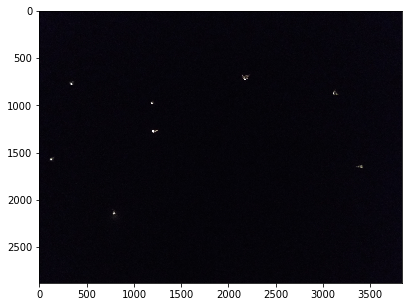

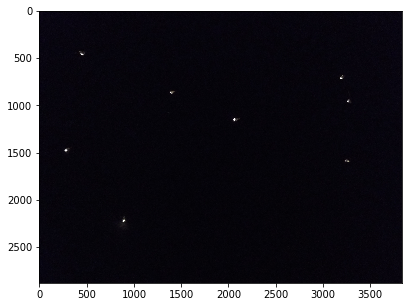

In [2]:
# Undistort and save images

from matplotlib.image import imsave

h, w = img1.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

img1_undst = img1.copy()
img2_undst = img2.copy()
count = 1
for img in (img1_undst, img2_undst):
    # undistort
    dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

    # crop the image
    x,y,w,h = roi
    dst = dst[y:y+h, x:x+w]

    # Display with plt.imshow (lines in RGB instead of BGR)
    plt.figure(figsize=(10,5))
    plt.imshow(dst, cmap = None, interpolation = None)
    
    # Save corrected images
    imsave("lightsc" + str(count) + ".png", dst)
    count += 1